In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_addons as tfa
import numpy as np
from matplotlib import pyplot as plt
import random
import time

import pathlib
import os
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img



#[Tensorflow Data(rock_paper_scissors )](https://www.tensorflow.org/datasets/catalog/rock_paper_scissors)

###Labels
* Rock: 0
* Paper: 1
* Scissor: 2



## Extracting Tensorflow Dataset 

In [ ]:
DATASET_NAME = 'rock_paper_scissors'

(dataset_train_raw, dataset_test_raw), dataset_info = tfds.load(
    name=DATASET_NAME,
    data_dir='tmp',
    with_info=True,
    as_supervised=True,
    split=[tfds.Split.TRAIN, tfds.Split.TEST],
)             

print(dataset_train_raw, dataset_test_raw)

<DatasetV1Adapter shapes: ((300, 300, 3), ()), types: (tf.uint8, tf.int64)> <DatasetV1Adapter shapes: ((300, 300, 3), ()), types: (tf.uint8, tf.int64)>


## Converting Tensorflow Dataset to Numpy array

> **rgb_to_grayscale():** Converts a coloured image to Gray scale

> **tfds.as_numpy():** Convert `tf.data.Dataset` to Python generator






In [ ]:
#Changing colour of image to Gray scale
def to_gray(image):
  image = tf.image.rgb_to_grayscale(image)
  image= np.array(image).reshape(300, 300,1)
  return image

In [ ]:
ds_train= tfds.as_numpy(dataset_train_raw) 
ds_test= tfds.as_numpy(dataset_test_raw) 

x_train, y_train, x_test, y_test=[], [],[], []
for img in ds_train:
  converted = to_gray(img[0])
  x_train.append(converted)
  y_train.append(img[1])

x_train=np.array(x_train).reshape(2520,300,300,1)
y_train=np.array(y_train)

for img in ds_test:
  converted = to_gray(img[0])
  x_test.append(converted)
  y_test.append(img[1])

x_test=np.array(x_test).reshape(372,300,300,1)
y_test=np.array(y_test)

print(x_train.shape, x_train[0].shape, y_train.shape)
print(x_test.shape, x_test[0].shape, y_test.shape)


(2520, 300, 300, 1) (300, 300, 1) (2520,)
(372, 300, 300, 1) (300, 300, 1) (372,)


## Plotting random values of Tensorflow Dataset

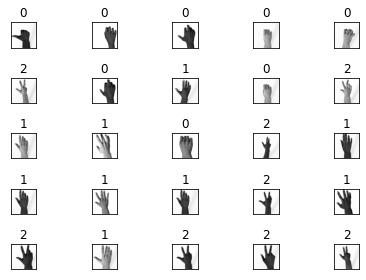

In [ ]:
n=5
j=1
rand=[random.randint(1,2000) for i in range(1,n*n+1)]
for i in rand:
  plt.subplot(n,n,j)
  plt.imshow(x_train[i].reshape(300,300), cmap="gray")
  plt.title("{0}".format( y_train[i]))
  plt.xticks([], [])
  plt.yticks([], [])
  j+=1

plt.tight_layout()
  

# Kaggle Data

##Downloading Kaggle.json file from local

In [ ]:
from google.colab import files
files.upload() 

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"shakshi15","key":"22f2ef02119f29271ecd0ceae48f73dc"}'}

# Downloading Kaggle [rock-paper-scissors-dataset ](https://www.kaggle.com/sanikamal/rock-paper-scissors-dataset)

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!kaggle datasets download -d sanikamal/rock-paper-scissors-dataset 

kaggle.json
 99% 449M/452M [00:11<00:00, 34.8MB/s]
100% 452M/452M [00:11<00:00, 40.2MB/s]


## Unzipping the data into input folder

In [ ]:
!unzip \*.zip  -d ./input

Streaming output truncated to the last 5000 lines.
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper04-119.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-000.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-001.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-002.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-003.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-004.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-005.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-006.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-007.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-008.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-009.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-010.png  
  inflating: ./input/Rock-Paper-Scissors/train/paper/paper05-011.png  
  inflating: ./input/Rock-

In [ ]:
!ls
! ls ./input/rock-paper-scissors/Rock-Paper-Scissors

input  kaggle.json  rock-paper-scissors-dataset.zip  sample_data  tmp
test  train  validation


In [ ]:
base_dir = './input/rock-paper-scissors/Rock-Paper-Scissors'
train_dir = os.path.join(base_dir, 'train')
paper_dir = os.path.join(train_dir, 'paper')
rock_dir = os.path.join(train_dir, 'rock')
scissors_dir = os.path.join(train_dir, 'scissors')
print(paper_dir)

paper_imgs = os.listdir(paper_dir)
rock_imgs = os.listdir(rock_dir)
scissors_imgs = os.listdir(scissors_dir)


./input/rock-paper-scissors/Rock-Paper-Scissors/train/paper


## Extracting the downloaded Data


> The **ImageDataGenerator** accepts the original data, randomly transforms it, and returns only the new, transformed data.

> **flow_from_directory:**
* **target_size:**	Tuple of integers (height, width), defaults to (256,256). 
* **color_mode:** One of "grayscale", "rgb", "rgba". Default: "rgb". 
* **class_mode:**	One of "categorical", "binary", "sparse", "input", or None. Default: "categorical". Determines the type of label arrays that are returned.
  * "categorical" will be 2D one-hot encoded labels, 
  * "binary" will be 1D binary labels
  * "sparse" will be 1D integer labels, 
  * If None, no labels are returned 
* **batch_size:**	Size of the batches of data (default: 32).
* **shuffle:**	Whether to shuffle the data (default: True).

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2)
validation_datagen = ImageDataGenerator(rescale=1.0/255)

In [ ]:
BATCH_SIZE = 2520
TARGET_SIZE = 300
train_generator = train_datagen.flow_from_directory(train_dir, 
                                                    target_size=(TARGET_SIZE, TARGET_SIZE), 
                                                    batch_size=BATCH_SIZE, 
                                                    shuffle=True,
                                                    class_mode='categorical')

Found 2520 images belonging to 3 classes.


## Converting the data into Numpy array, in desired format

In [ ]:
print(type(train_generator))
x, y = train_generator.next()

<class 'keras_preprocessing.image.directory_iterator.DirectoryIterator'>


In [ ]:
### Convert Labels in defined form.
def convertlabel(label):
  if label[0]==1. :
    return 1
  if label[1]==1. :
    return 0
  if label[2]==1. :
    return 2

In [ ]:
y_train_kaggle=np.array(list(map(lambda y_label: convertlabel(y_label),y)))
x_train_kaggle=np.array(list(map(lambda x_train: to_gray(x_train),x)))

([], [])

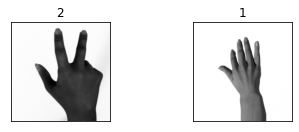

In [ ]:
plt.subplot(2,2,1)
plt.imshow(x_train_kaggle[2].reshape(300, 300), cmap="gray")
plt.title(y_train_kaggle[2])
plt.xticks([], [])
plt.yticks([], [])
converted1=to_gray(x[1])
plt.subplot(2,2,2)
plt.imshow(x_train_kaggle[6].reshape(300, 300), cmap="gray")
plt.title(y_train_kaggle[6])
plt.xticks([], [])
plt.yticks([], [])


In [ ]:
x_train=np.concatenate((x_train, x_train_kaggle), axis=0)
y_train=np.concatenate((y_train, y_train_kaggle), axis=0)

print(x_train.shape, y_train.shape)

(5040, 300, 300, 1) (5040,)


### Increasing the dataset by appending the fliped and rotated images

> **flip_left_right:** Flip an image horizontally (left to right).

> **rot90:** Rotate image(s) counter-clockwise by 90 degrees.
```
tf.image.rot90(
    image, k=1, name=None
)
```
**k:**	A scalar integer. The number of times the image is rotated by 90 degrees.


In [ ]:
def mirror_img(image) :
    image = tf.image.flip_left_right(image)
    return image


def rotation(image):
  image=tf.image.rot90(image, k=3)
  return image

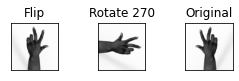

In [ ]:
plt.subplot(4,4,1)
img_flip=mirror_img(x_train[1]).numpy()
plt.imshow(img_flip.reshape(300,300), cmap="gray")
plt.title("Flip")
plt.xticks([], [])
plt.yticks([], [])
plt.subplot(4,4,2)
img_rotate=rotation(x_train[1]).numpy()
plt.imshow(img_rotate.reshape(300,300), cmap="gray")
plt.title("Rotate 270")
plt.xticks([], [])
plt.yticks([], [])
plt.subplot(4,4,3)
plt.imshow(x_train[1].reshape(300,300), cmap="gray")
plt.title("Original")
plt.xticks([], [])
plt.yticks([], [])
plt.show()


In [ ]:
x_changed=[]
y_changed=[]

for rand in ([random.randint(1,5000) for i in range(1,1500)]):

  x_changed.append(mirror_img(x_train[rand]).numpy())
  y_changed.append(y_train[rand])

for rand in ([random.randint(1,5000) for i in range(1,500)]):
  x_changed.append(rotation(x_train[rand]).numpy())
  y_changed.append(y_train[rand])

x_changed=np.array(x_changed)
y_changed=np.array(y_changed)

x_test_changed=[]
y_test_changed=[]

for rand in ([random.randint(1,5040) for i in range(1,100)]):
  x_test_changed.append(mirror_img(x_train[rand]).numpy())
  y_test_changed.append(y_train[rand])

for rand in ([random.randint(1,5040) for i in range(1,50)]):
  x_test_changed.append(rotation(x_train[rand]).numpy())
  y_test_changed.append(y_train[rand])

x_test_changed=np.array(x_test_changed)
y_test_changed=np.array(y_test_changed)

0
(1998, 300, 300, 1) (1998,) (7038, 300, 300, 1) (7038,) (520, 300, 300, 1) (520,)


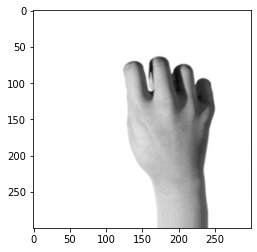

In [ ]:
x_train=np.concatenate((x_train, x_changed), axis=0)
y_train=np.concatenate((y_train, y_changed), axis=0)

x_test=np.concatenate((x_test, x_test_changed), axis=0)
y_test=np.concatenate((y_test, y_test_changed), axis=0)



plt.imshow(x_train[3000].reshape(300,300), cmap="gray")
print(y_train[3000])
print(x_changed.shape, y_changed.shape, x_train.shape, y_train.shape, x_test.shape, y_test.shape)


In [ ]:
x_train=x_train/255.0
x_test=x_test/255.0

 ### Shuffling the Data

 > **from_tensor_slices:** Returns slices of an array in the form of objects

```
# import tensorflow 
import tensorflow as tf 
  
# using tf.data.Dataset.from_tensor_slices() method 
gfg = tf.data.Dataset.from_tensor_slices([[5, 10], [3, 6]]) 
  
for ele in gfg: 
    print(ele.numpy()) 

OUTPUT

[5, 10]
[3, 6]
```



In [ ]:

train_dataset = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))

In [ ]:

BATCH_SIZE = 64
SHUFFLE_BUFFER_SIZE = 6500

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

print(type(train_dataset))

<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>


## Training the model

###**Activation Functions**

**SWISH**
* It is the multiplication of the input x with the sigmoid function for x 
* It does not abruptly change direction like ReLU does near x = 0. 
* Rather, it smoothly bends from 0 towards values < 0 and then upwards again.

![Swish](https://miro.medium.com/max/417/1*SZ19lV6FT24KtdZsvCOCaA.png)

### **MaxPool2D**

```
tf.keras.layers.MaxPool2D(
    pool_size=(2, 2), strides=None, padding='valid', data_format=None, **kwargs
)
```

**Sequential model**
A Sequential model is appropriate for a plain stack of layers where each layer has exactly one input tensor and one output tensor.

### **Conv2D**

**filters**	: Integer, the dimensionality of the output space (i.e. the number of output filters in the convolution).

**kernel_size**:	An integer or tuple/list of 2 integers, specifying the height and width of the 2D convolution window. Can be a single integer to specify the same value for all spatial dimensions.






In [ ]:
 model = tf.keras.models.Sequential(
     [tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(300, 300,1)),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Conv2D(64, (3,3), activation='swish', input_shape=(300, 300,1)),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(128, (3,3), activation='relu', input_shape=(300, 300,1)),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(128, (3,3), activation='relu', input_shape=(300, 300,1)),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(128, (3,3), activation='relu', input_shape=(300, 300,1)),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Conv2D(128, (3,3), activation='relu', input_shape=(300, 300,1)),
      tf.keras.layers.MaxPooling2D(2,2),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dropout(0.5),
      tf.keras.layers.Dense(512, activation='relu'),
      tf.keras.layers.Dense(3, activation='softmax')])
 
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 64)      640       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 64)      36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 71, 71, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 35, 35, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 33, 33, 128)       1

In [ ]:
model.compile(optimizer =tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss = 'sparse_categorical_crossentropy',
              metrics=['accuracy'],)
m=model.fit(x=train_dataset.repeat(),steps_per_epoch=6500//BATCH_SIZE, epochs=9, validation_data=(test_dataset.repeat()), validation_steps=int(500//BATCH_SIZE))

Epoch 1/9
101/101 [==============================] - 55s 544ms/step - loss: 1.0108 - accuracy: 0.4308 - val_loss: 0.6883 - val_accuracy: 0.6339
Epoch 2/9
101/101 [==============================] - 59s 582ms/step - loss: 0.6794 - accuracy: 0.6181 - val_loss: 0.6643 - val_accuracy: 0.8080
Epoch 3/9
101/101 [==============================] - 55s 546ms/step - loss: 0.6000 - accuracy: 0.6541 - val_loss: 0.2411 - val_accuracy: 0.8929
Epoch 4/9
101/101 [==============================] - 55s 543ms/step - loss: 0.4085 - accuracy: 0.8104 - val_loss: 0.0857 - val_accuracy: 0.9621
Epoch 5/9
101/101 [==============================] - 55s 542ms/step - loss: 0.1280 - accuracy: 0.9520 - val_loss: 0.4277 - val_accuracy: 0.9062
Epoch 6/9
101/101 [==============================] - 55s 541ms/step - loss: 0.0769 - accuracy: 0.9771 - val_loss: 0.2074 - val_accuracy: 0.9554
Epoch 7/9
101/101 [==============================] - 55s 542ms/step - loss: 0.0605 - accuracy: 0.9803 - val_loss: 0.2312 - val_accuracy:

In [ ]:
model.evaluate(test_dataset)


9/9 [==============================] - 2s 199ms/step - loss: 0.3329 - accuracy: 0.9538


[0.33286604285240173, 0.9538461565971375]

In [ ]:
# Save the weights
t=str(int(time.time()))
model.save_weights('./drive/My Drive/Colab Notebooks/TrainedData/RockPaperScissor_'+ t+ '/RockPaperScissor' )


## Plotting 
*  Accuracy verses Epoch Graph for both train and validation data
*  Loss verses Epoch Graph for both train and validation data

In [ ]:
print(m.history.keys())
loss=(m.history['loss'])
accuracy=m.history['accuracy']
val_loss=m.history['val_loss']
val_accuracy=m.history['val_accuracy']
epoch=[i for i in range(1,10)]


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


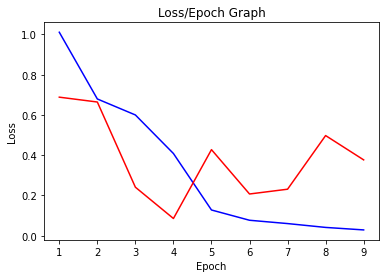

Text(0, 0.5, 'Accuracy')

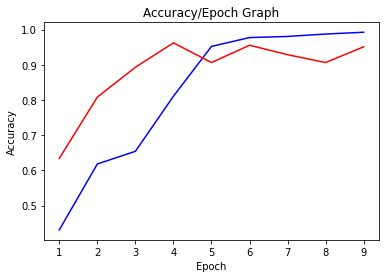

In [ ]:
plt.plot(epoch, (loss), 'b-')
plt.plot(epoch, val_loss, 'r-')
plt.title("{0}".format( "Loss/Epoch Graph"))
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()
plt.plot(epoch, accuracy, 'b-')
plt.plot(epoch, val_accuracy, 'r-')
plt.title("{0}".format( "Accuracy/Epoch Graph"))
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

In [ ]:
print(x_test[1].shape)
predictions = model.predict(x_test)
print(predictions[2], y_test[2])

#y.eval(feed_dict={x: x_test[1]})

(300, 300, 1)
[2.4323868e-17 2.2737395e-16 1.0000000e+00] 2


### Testing model on real time images

In [ ]:
from google.colab import files
files.upload() 

Saving 2020_07_28 8_57 pm Office Lens (3).jpg to 2020_07_28 8_57 pm Office Lens (3).jpg
Saving 2020_07_28 8_57 pm Office Lens (4).jpg to 2020_07_28 8_57 pm Office Lens (4).jpg
Saving 2020_07_28 8_57 pm Office Lens (5).jpg to 2020_07_28 8_57 pm Office Lens (5).jpg
Saving IMG_20200728_203805.jpg to IMG_20200728_203805.jpg
Saving IMG_20200728_203832.jpg to IMG_20200728_203832.jpg


{'2020_07_28 8_57 pm Office Lens (3).jpg': b'\xff\xd8\xff\xe1\x025Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x08\x01\x00\x00\x03\x00\x00\x00\x01\x14@\x00\x00\x01\x10\x00\x02\x00\x00\x00\x08\x00\x00\x00n\x01\x01\x00\x03\x00\x00\x00\x01\x0f(\x00\x00\x01\x0f\x00\x02\x00\x00\x00\x07\x00\x00\x00v\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\x91\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00}\x88%\x00\x04\x00\x00\x00\x01\x00\x00\x00\xef\x00\x00\x00\x00POCO F1\x00Xiaomi\x002020:07:28 20:56:08\x00\x00\x06\xa4\x03\x00\x03\x00\x00\x00\x01\x00\x00\x00\x00\x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xdf\x88\'\x00\x03\x00\x00\x00\x01\x00\xda\x00\x00\x92\t\x00\x03\x00\x00\x00\x01\x00\x10\x00\x00\x92\x08\x00\x04\x00\x00\x00\x01\x00\x00\x00\x00\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x01/\x00\x00\'\x10\x00\x00N \x00\x00\'\x10\x00\t\x00\x02\x00\x05\x00\x00\x00\x03\x00\x00\x01a\x00\x06\x00\x05\x00\x00\x00\x01\x00\x00\x01y\x00\x01\x00\x02

In [ ]:
! mkdir test_img
!ls

'2020_07_28 8_57 pm Office Lens (3).jpg'   kaggle.json
'2020_07_28 8_57 pm Office Lens (4).jpg'   rock-paper-scissors-dataset.zip
'2020_07_28 8_57 pm Office Lens (5).jpg'   sample_data
 IMG_20200728_203805.jpg		   test
 IMG_20200728_203832.jpg		   test_img
 input					   tmp


In [ ]:
!cp '2020_07_28 8_57 pm Office Lens (3).jpg' ./test_img/
!cp '2020_07_28 8_57 pm Office Lens (4).jpg' ./test_img/
!cp '2020_07_28 8_57 pm Office Lens (5).jpg' ./test_img/
!cp 'IMG_20200728_203805.jpg' ./test_img/
!cp 'IMG_20200728_203832.jpg' ./test_img/


In [ ]:
test_dir='./test_img'

test_img=[]
for img in os.listdir(test_dir):
  print()
  image = tf.image.decode_jpeg(tf.io.read_file(test_dir+'/'+img))
  image=tf.image.resize(image, [300,300])
  image=to_gray(image)
  test_img.append(image)

test_img=np.array(test_img)
print(test_img.shape, test_img[0].shape)







(5, 300, 300, 1) (300, 300, 1)


In [ ]:
predictions = model.predict(test_img)
print(predictions)


[[0. 1. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]]


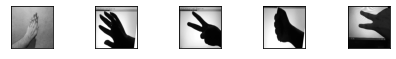

In [ ]:
n=5
j=1
#rand=[random.randint(1,2000) for i in range(0,6)]
for i in test_img:
  plt.subplot(n,n,j)
  plt.imshow(i.reshape(300,300), cmap="gray")
  #plt.title("{0}".format( y_train[i]))
  plt.xticks([], [])
  plt.yticks([], [])
  j+=1


plt.tight_layout()
  